# Mask R-CNN Demo

A quick intro to using the pre-trained model to detect and segment objects.

In [1]:
import os
import io
import random
import math
import numpy as np
import skimage.io
import matplotlib.pyplot as plt
import pycocotools
import tensorflow as tf
import tqdm
import mrcnn.model as modellib
import pickle

from copy import deepcopy
from tensorflow import keras
from datetime import datetime

from mrcnn import utils
from mrcnn import visualize
from mrcnn import config

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = "logs"

# Local path to trained weights file
COCO_MODEL_PATH = "mask_rcnn_coco.h5"

# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

from deepfashion2_to_coco import get_dataset_loader, get_dataset_categories
import deepfashion2_mrcnn_dataset

Using TensorFlow backend.


In [2]:
# df2_train_loader = get_dataset_loader('datasets/DeepFashion2/train/')

In [3]:
# df2_val_loader = get_dataset_loader('datasets/DeepFashion2/validation')

In [4]:
# with open('df2_train_loader.pkl', 'wb') as fp:
#     pickle.dump(df2_train_loader, fp, protocol=pickle.HIGHEST_PROTOCOL)

In [5]:
# with open('df2_val_loader.pkl', 'wb') as fp:
#     pickle.dump(df2_val_loader, fp, protocol=pickle.HIGHEST_PROTOCOL)

In [6]:
with open('df2_train_loader.pkl', 'rb') as fp:
    df2_train_loader = pickle.load(fp)

In [7]:
with open('df2_val_loader.pkl', 'rb') as fp:
    df2_val_loader = pickle.load(fp)

In [8]:
classes = get_dataset_categories()
class_names = ['background']
class_names.extend([x['name'] for x in classes])

### Assign weight to samples according to occlusion
We want to make the occluded samples less relevant as they do not represent a proper manifold for an item in the category

In [9]:
def assign_weight_according_occlusion(dataset_loader):
    for image in tqdm.tqdm(dataset_loader['images']):
        max_occlusion = max([annotation['occlusion'] for annotation in image['annotations']])
        image['weight'] = 1/max_occlusion
        
assign_weight_according_occlusion(df2_train_loader)
assign_weight_according_occlusion(df2_val_loader)

df2_train_dataset = deepfashion2_mrcnn_dataset.DeepFashion2Dataset()
df2_train_dataset.load(df2_train_loader)
df2_train_dataset.prepare()

df2_val_dataset = deepfashion2_mrcnn_dataset.DeepFashion2Dataset()
df2_val_dataset.load(df2_val_loader)
df2_val_dataset.prepare()

100%|██████████| 32152/32152 [00:00<00:00, 824515.38it/s]


## Dataset statistics

In [10]:
print(f'Number of images in training dataset: {len(df2_train_loader["images"])}')
print(f'Number of images in validation dataset: {len(df2_val_loader["images"])}')

Number of images in training dataset: 191960
Number of images in validation dataset: 32152


In [11]:
def get_image_info(image, bboxes):
    new_img_info = deepcopy(image)
    for ann, bbox in zip(new_img_info['annotations'], bboxes):
        ann['bbox'] = bbox
    return new_img_info

image_info_train_mask_bbox = np.array([ 
    get_image_info(image, utils.extract_bboxes(df2_train_dataset.load_mask(i)[0]))
    for i, image in enumerate(tqdm.tqdm(df2_train_loader['images']))
])

image_info_val_mask_bbox = np.array([ 
    get_image_info(image, utils.extract_bboxes(df2_val_dataset.load_mask(i)[0]))
    for i, image in enumerate(tqdm.tqdm(df2_val_loader['images']))
])

100%|██████████| 32152/32152 [01:18<00:00, 411.46it/s]


In [12]:
# Maximum edge size for every image
max_dims_train = np.array([max(image['width'], image['height']) for image in df2_train_loader['images']], dtype=np.float64)
max_dims_val = np.array([max(image['width'], image['height']) for image in df2_val_loader['images']], dtype=np.float64)
# scale down for the neural network
scales_train = 256.0/max_dims_train
scales_val = 256.0/max_dims_val

# Bounding boxes and their corresponding area
bbox_sizes_train = np.array([ 
    (ann['bbox'][2]-ann['bbox'][0])*(ann['bbox'][3]-ann['bbox'][1])
    for i, image in enumerate(tqdm.tqdm(image_info_train_mask_bbox))
    for ann in image['annotations']
])

bbox_sizes_val = np.array([ 
    (ann['bbox'][2]-ann['bbox'][0])*(ann['bbox'][3]-ann['bbox'][1])
    for i, image in enumerate(tqdm.tqdm(image_info_val_mask_bbox))
    for ann in image['annotations']
])

# Areas covered by bounding boxes when processed by the NN with max image size of 256px
bbox_sizes_scaled_train = np.array([ 
    (ann['bbox'][2]-ann['bbox'][0])*(ann['bbox'][3]-ann['bbox'][1])*scales_train[i]
    for i, image in enumerate(tqdm.tqdm(image_info_train_mask_bbox))
    for ann in image['annotations']
])    

bbox_sizes_scaled_val = np.array([ 
    (ann['bbox'][2]-ann['bbox'][0])*(ann['bbox'][3]-ann['bbox'][1])*scales_train[i]
    for i, image in enumerate(tqdm.tqdm(image_info_val_mask_bbox))
    for ann in image['annotations']
])  

print(f'Number of clothing items in training dataset: {bbox_sizes_train.shape[0]}')
print(f'Number of clothing items in validation dataset: {bbox_sizes_val.shape[0]}')

100%|██████████| 32152/32152 [00:00<00:00, 180265.13it/s]Number of clothing items in training dataset: 312184
Number of clothing items in validation dataset: 52489



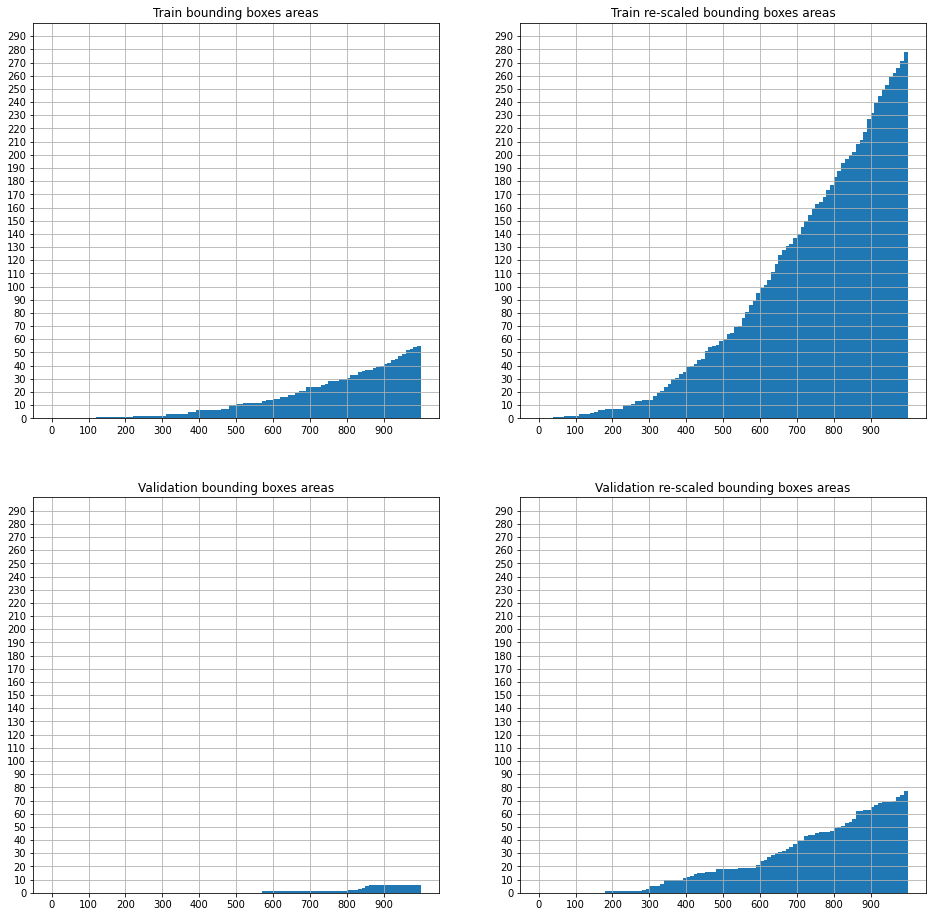

In [13]:
fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(16,16
))

plt.subplot(2, 2, 1)
plt.title('Train bounding boxes areas')
plt.grid()
plt.ylim([0, 300])
plt.yticks(np.arange(0,300,10))
plt.xticks(np.arange(0,1000,100))
plt.hist(bbox_sizes_train, bins=100, range=(0, 1000), cumulative=True)

plt.subplot(2, 2, 2)
plt.title('Train re-scaled bounding boxes areas')
plt.grid()
plt.ylim([0, 300])
plt.yticks(np.arange(0,300,10))
plt.xticks(np.arange(0,1000,100))
plt.hist(bbox_sizes_scaled_train, bins=100, range=(0, 1000), cumulative=True)

plt.subplot(2, 2, 3)
plt.title('Validation bounding boxes areas')
plt.grid()
plt.ylim([0, 300])
plt.yticks(np.arange(0,300,10))
plt.xticks(np.arange(0,1000,100))
plt.hist(bbox_sizes_val, bins=100, range=(0, 1000), cumulative=True)

plt.subplot(2, 2, 4)
plt.title('Validation re-scaled bounding boxes areas')
plt.grid()
plt.ylim([0, 300])
plt.yticks(np.arange(0,300,10))
plt.xticks(np.arange(0,1000,100))
plt.hist(bbox_sizes_scaled_val, bins=100, range=(0, 1000), cumulative=True)
plt.show()

In [14]:
def get_image_bbox_ratio(img_width, img_height, bbox):
    bbox_area = (bbox[2]-bbox[0])*(bbox[3]-bbox[1])
    image_area = img_width*img_height
    return bbox_area/image_area

images_bboxes_ratio_train = np.array([ 
    [int(i), int(image['id']), ann['image_id'], get_image_bbox_ratio(image['width'], image['height'], ann['bbox'])]
    for i, image in enumerate(tqdm.tqdm(image_info_train_mask_bbox))
    for ann in image['annotations']
])

images_bboxes_ratio_val = np.array([ 
    np.array([i, image['id'], get_image_bbox_ratio(image['width'], image['height'], ann['bbox'])])
    for i, image in enumerate(tqdm.tqdm(image_info_val_mask_bbox))
    for ann in image['annotations']
])

scale_occ_zoom_view = np.array([ 
    [ann['scale'], ann['occlusion'], ann['zoom_in'], ann['viewpoint']]
    for i, image in enumerate(tqdm.tqdm(image_info_train_mask_bbox))
    for ann in image['annotations']
])

bboxes_train = np.array([ 
    [int(i), int(image['id']), ann['image_id'], (ann['area']/(image['width']*image['height']))]
    for i, image in enumerate(tqdm.tqdm(df2_train_loader['images']))
    for ann in image['annotations']
])

scale_occ_zoom_view_hist_cnts, scale_occ_zoom_view_hist_bins = np.apply_along_axis(lambda x: np.histogram(x, bins=[1, 2, 3, 4]), 0, scale_occ_zoom_view)
prev_scale_hist_cnts, prev_scale_hist_bins = np.histogram(bboxes_train[:,3], bins=[0, .1, .4, 1])
scale_hist_cnts, scale_hist_bins = np.histogram(images_bboxes_ratio_train[:,3], bins=[0, .1, .4, 1])

100%|██████████| 191960/191960 [00:00<00:00, 675331.17it/s]


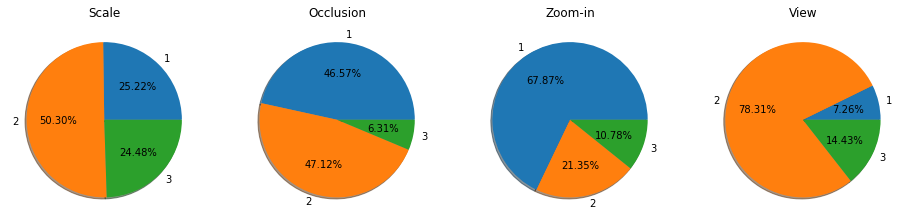

In [15]:
plt.figure(figsize=(16,8))
plt.subplot(1, 4, 1)
plt.title('Scale')
plt.pie(x=scale_occ_zoom_view_hist_cnts[0], autopct='%1.2f%%', shadow=True, startangle=0, labels=scale_occ_zoom_view_hist_bins[0][:-1])

plt.subplot(1, 4, 2)
plt.title('Occlusion')
plt.pie(x=scale_occ_zoom_view_hist_cnts[1], autopct='%1.2f%%', shadow=True, startangle=0, labels=scale_occ_zoom_view_hist_bins[1][:-1])

plt.subplot(1, 4, 3)
plt.title('Zoom-in')
plt.pie(x=scale_occ_zoom_view_hist_cnts[2], autopct='%1.2f%%', shadow=True, startangle=0, labels=scale_occ_zoom_view_hist_bins[2][:-1])

plt.subplot(1, 4, 4)
plt.title('View')
plt.pie(x=scale_occ_zoom_view_hist_cnts[3], autopct='%1.2f%%', shadow=True, startangle=0, labels=scale_occ_zoom_view_hist_bins[3][:-1])
plt.show()

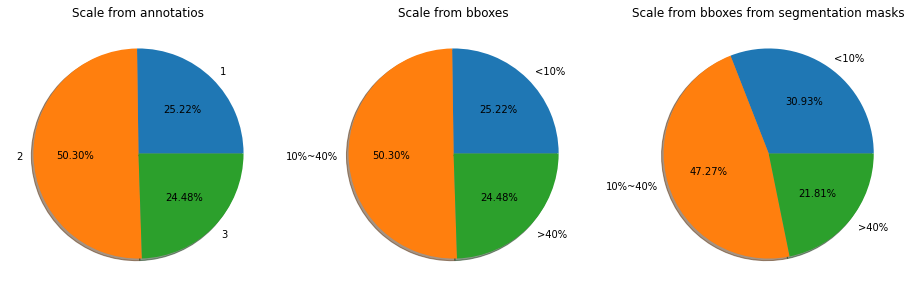

In [16]:
plt.figure(figsize=(16,8))

plt.subplot(1, 3, 1)
plt.title('Scale from annotatios')
plt.pie(x=scale_occ_zoom_view_hist_cnts[0], autopct='%1.2f%%', shadow=True, startangle=0, labels=scale_occ_zoom_view_hist_bins[0][:-1])

plt.subplot(1, 3, 2)
plt.title('Scale from bboxes')
plt.pie(x=prev_scale_hist_cnts, labels=['<10%', '10%~40%', '>40%'], autopct='%1.2f%%', shadow=True, startangle=0)

plt.subplot(1, 3, 3)
plt.title('Scale from bboxes from segmentation masks')
plt.pie(x=scale_hist_cnts, labels=['<10%', '10%~40%', '>40%'], autopct='%1.2f%%', shadow=True, startangle=0)

plt.show()

### Assign weights based on the number of samples in the category

100%|██████████| 191960/191960 [00:05<00:00, 32138.37it/s]


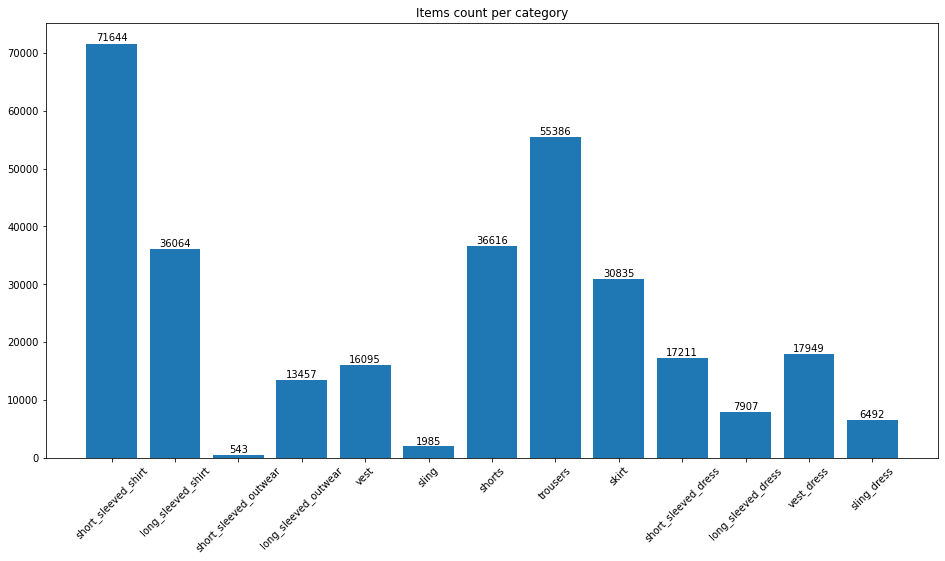

In [17]:
classes_train = np.array([ 
    [int(i), int(image['id']), ann['image_id'], ann['category_id'], ann['category_name']]
    for i, image in enumerate(tqdm.tqdm(df2_train_loader['images']))
    for ann in image['annotations']
])

classes_hist_cnts, classes_hist_bins = np.histogram(np.array(classes_train[:, 3], dtype=np.int), bins=range(1,15))

plt.figure(figsize=(16,8))
plt.title('Items count per category')
plt.xticks(horizontalalignment='center', rotation=45)
plot = plt.bar(x=class_names[1:], height=classes_hist_cnts)

# Add the data value on head of the bar
for value in plot:
    height = value.get_height()
    plt.text(value.get_x() + value.get_width()/2.,
             1.002*height,'%d' % int(height), ha='center', va='bottom')
    
plt.show()

In [18]:
weights = max(classes_hist_cnts)/classes_hist_cnts
norm_weights = (weights - min(weights))/(max(weights) - min(weights))
print('weights:', weights)
print('norm_weights:', norm_weights)

weights: [  1.           1.98657941 131.94106814   5.32392064   4.45132029
  36.09269521   1.95663098   1.29353988   2.3234636    4.16268665
   9.06083217   3.99153156  11.03573629]
norm_weights: [0.         0.00753453 1.         0.03302188 0.02635781 0.26800373
 0.00730581 0.00224177 0.01010732 0.02415351 0.06156076 0.0228464
 0.07664315]


### Sizes of the objects (bounding boxes)

In [19]:
base_path = os.path.join(os.path.abspath(os.path.join('../../', os.path.curdir)), 'datasets/DeepFashion2/validation/image')
for i in range(len(df2_val_dataset.image_info)):
    file_name = os.path.split(df2_val_dataset.image_info[i]['path'])[1]
    df2_val_dataset.image_info[i]['path'] = os.path.join(base_path, file_name)

In [20]:
base_path = os.path.join(os.path.abspath(os.path.join('../../', os.path.curdir)), 'datasets/DeepFashion2/train/image')
for i in range(len(df2_train_dataset.image_info)):
    file_name = os.path.split(df2_train_dataset.image_info[i]['path'])[1]
    df2_train_dataset.image_info[i]['path'] = os.path.join(base_path, file_name)

100%|██████████| 191960/191960 [00:00<00:00, 399617.32it/s]
35
Image ID: 4242
Class IDs: [9 1]
Bounding boxes: [[110  46 319 232]
 [  2  48 115 202]]
Areas: [[38874 17402]]
Captions: ['skirt' 'short_sleeved_shirt']
Bounding boxes: [[110  46 319 232]
 [  2  48 115 202]]
Areas: [[38874 17402]]
Scaled bounding boxes: [[ 55  79 159 172]
 [  1  80  58 157]]
Scaled areas: [[9672 4389]]


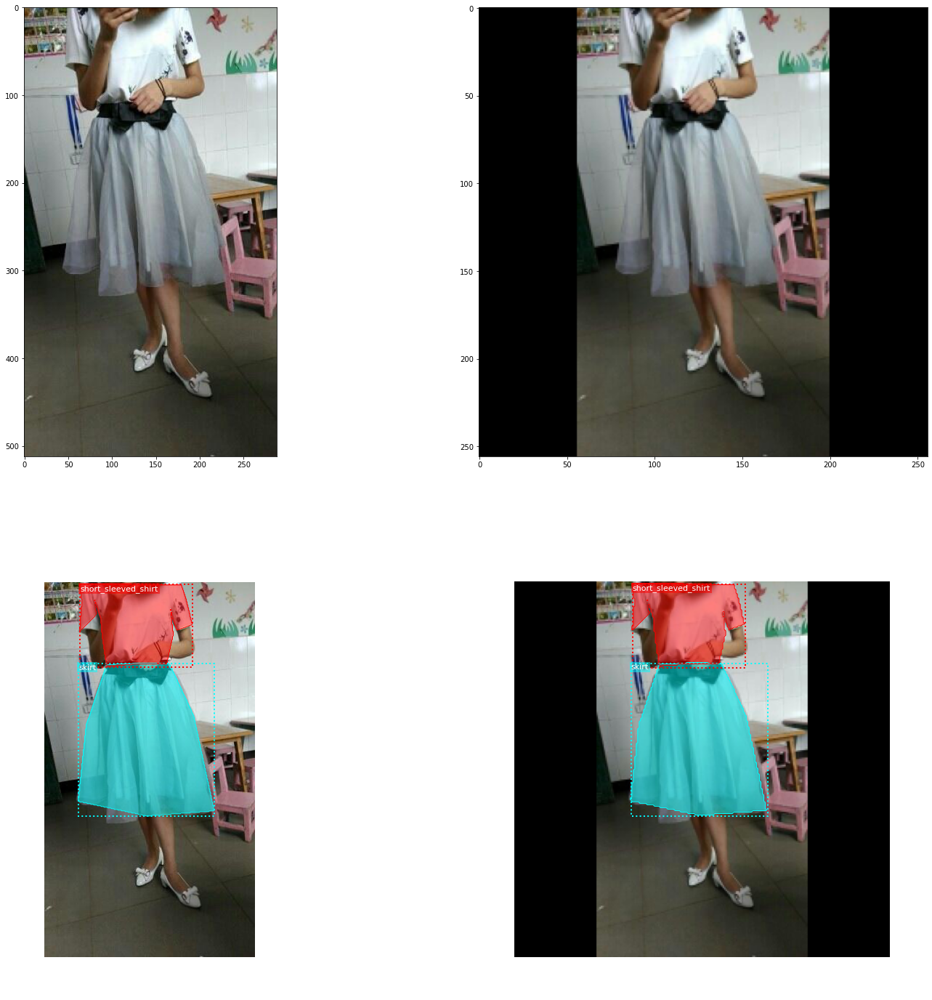

Image ID: 16635
Class IDs: [7 5]
Bounding boxes: [[303 344 352 425]
 [201 336 302 410]]
Areas: [[3969 7474]]
Captions: ['shorts' 'vest']
Bounding boxes: [[303 344 352 425]
 [201 336 302 410]]
Areas: [[3969 7474]]
Scaled bounding boxes: [[121 137 141 169]
 [ 81 134 121 163]]
Scaled areas: [[ 640 1160]]


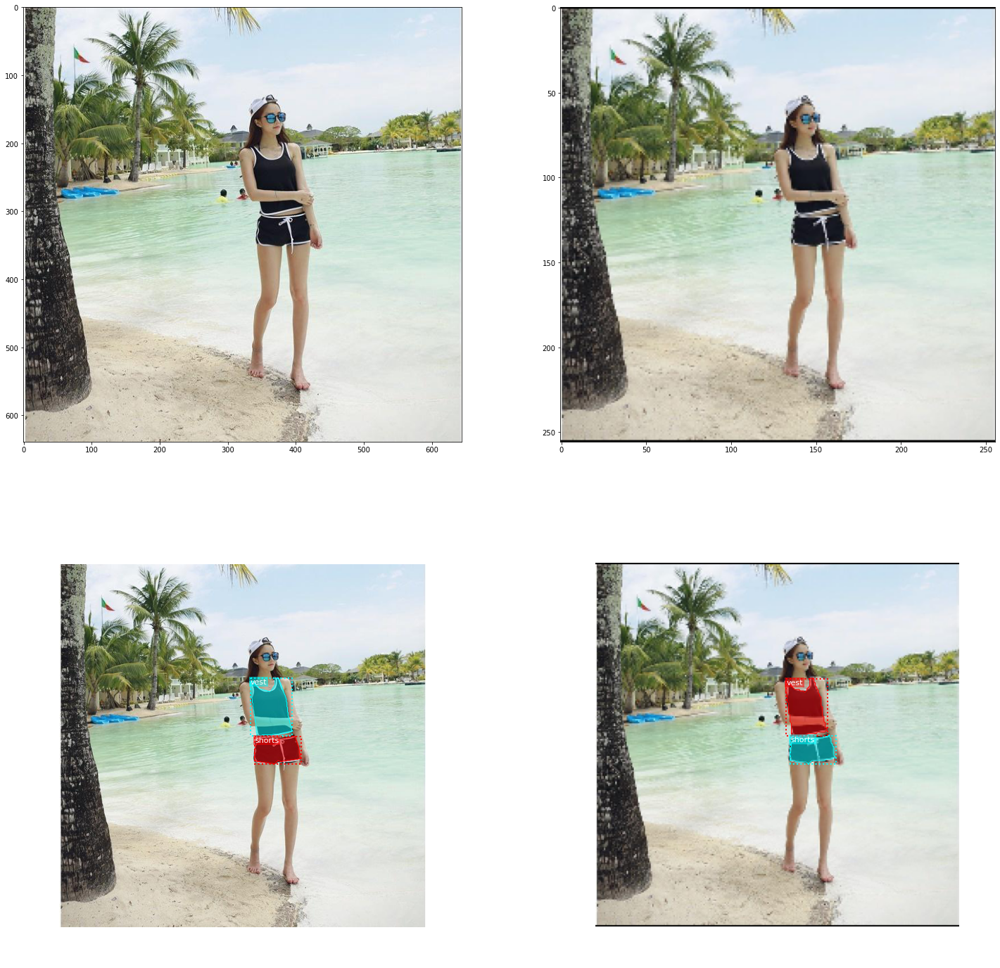

Image ID: 26461
Class IDs: [ 2 10]
Bounding boxes: [[449 135 478 178]
 [399 352 615 469]]
Areas: [[ 1247 25272]]
Captions: ['long_sleeved_shirt' 'short_sleeved_dress']
Bounding boxes: [[449 135 478 178]
 [399 352 615 469]]
Areas: [[ 1247 25272]]
Scaled bounding boxes: [[119  64 127  75]
 [106 121 163 152]]
Scaled areas: [[  88 1767]]


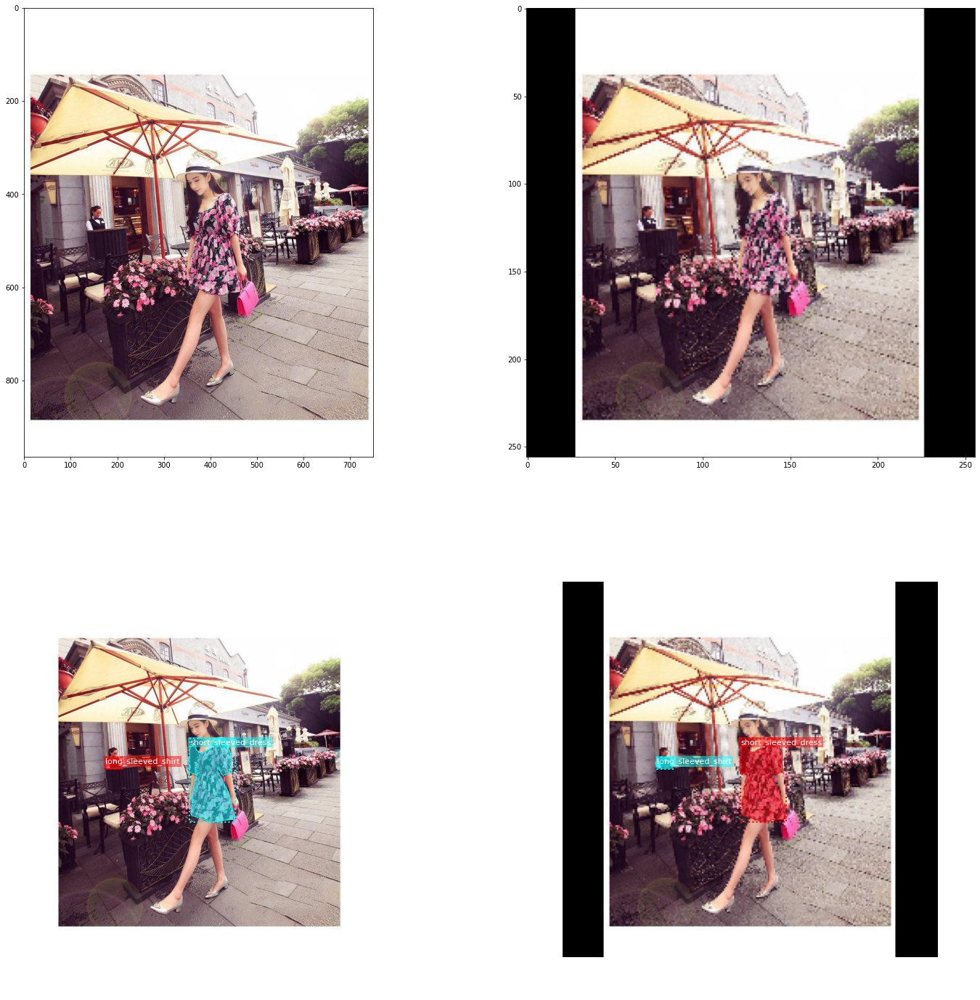

Image ID: 26461
Class IDs: [ 2 10]
Bounding boxes: [[449 135 478 178]
 [399 352 615 469]]
Areas: [[ 1247 25272]]
Captions: ['long_sleeved_shirt' 'short_sleeved_dress']
Bounding boxes: [[449 135 478 178]
 [399 352 615 469]]
Areas: [[ 1247 25272]]
Scaled bounding boxes: [[119  64 127  75]
 [106 121 163 152]]
Scaled areas: [[  88 1767]]


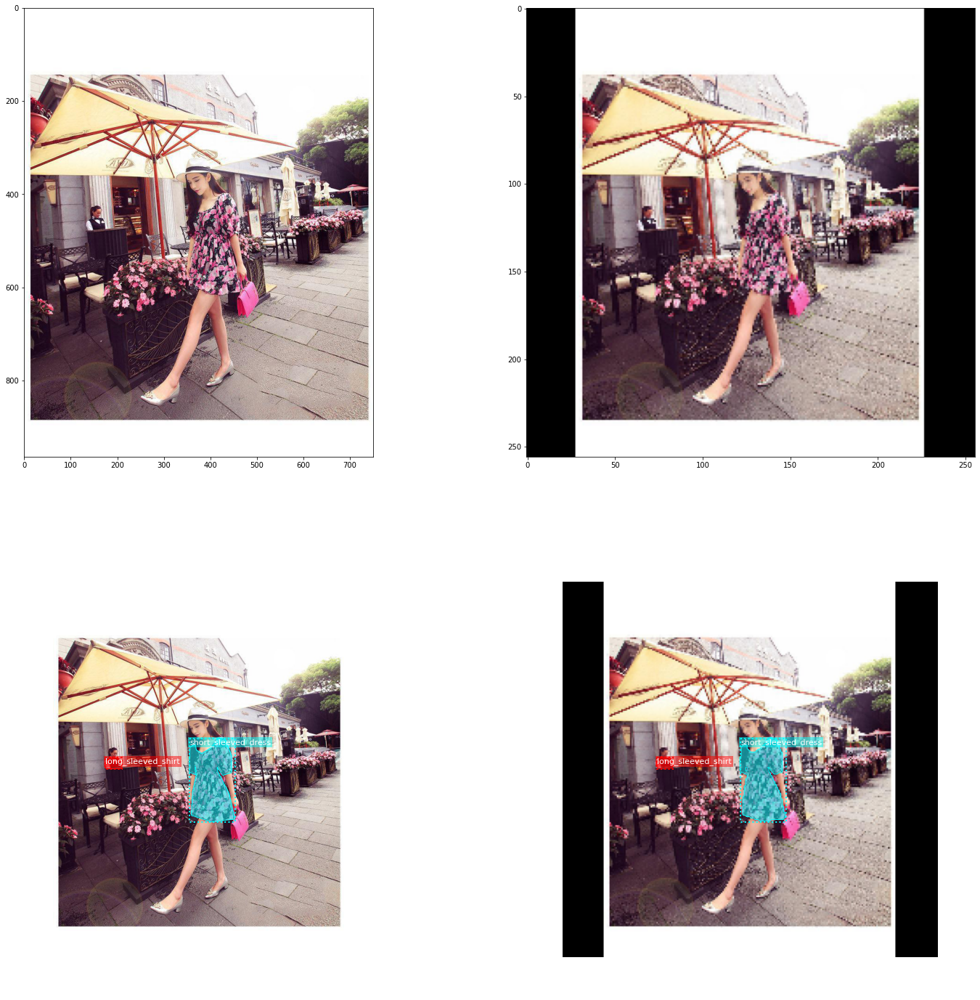

Image ID: 26462
Class IDs: [10]
Bounding boxes: [[400 252 638 515]]
Areas: [[62594]]
Captions: ['short_sleeved_dress']
Bounding boxes: [[400 252 638 515]]
Areas: [[62594]]
Scaled bounding boxes: [[142  86 223 176]]
Scaled areas: [[7290]]


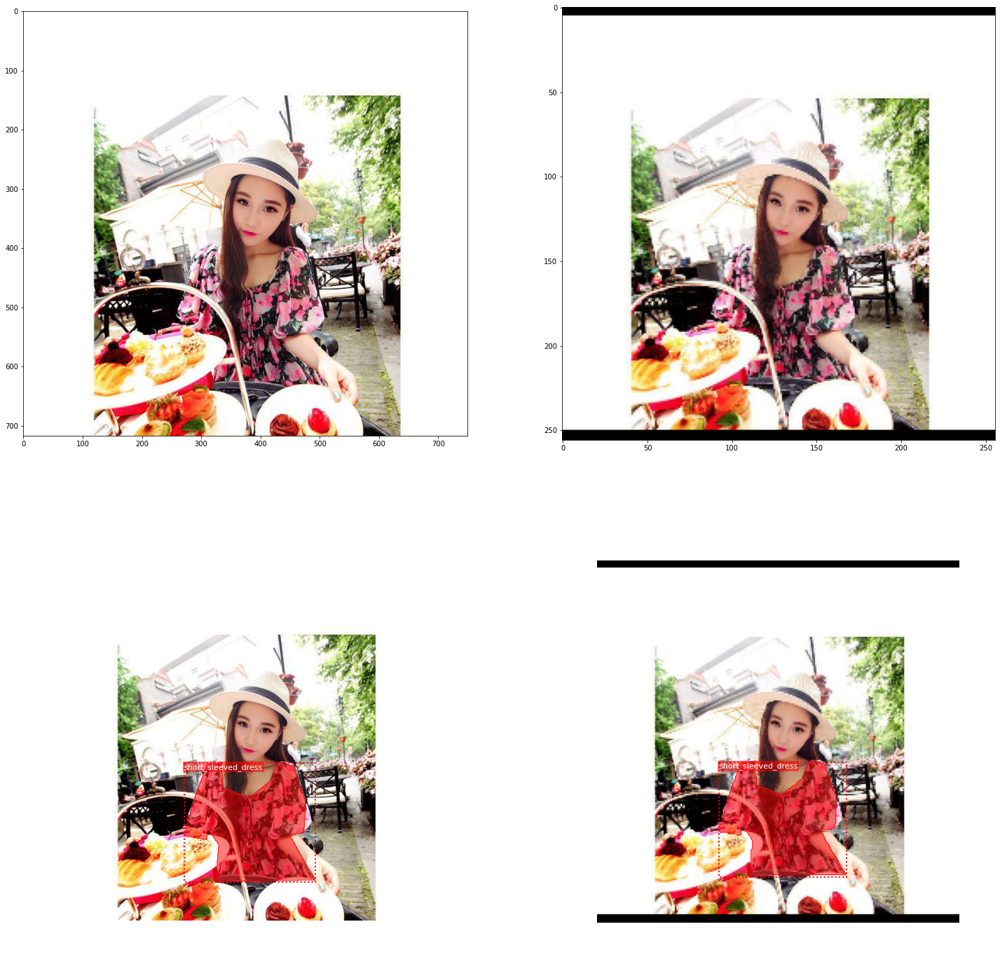

In [21]:
small_imgs_ix = bbox_sizes_scaled_train < 400
small_imgs = []

j=0
for i, image in enumerate(tqdm.tqdm(image_info_train_mask_bbox)):
    for ann in enumerate(image['annotations']):
        if small_imgs_ix[j] == True:
            small_imgs.append(image)
        j+=1


print(len(small_imgs))

for image_info in small_imgs[:5]:
    img_id = image_info['id']
    max_img_size = 256

    img = df2_train_dataset.load_image(img_id)
    masks, class_ids = df2_train_dataset.load_mask(img_id)
    bboxes = utils.extract_bboxes(masks)
    areas = np.array([(bboxes[:,2] - bboxes[:,0]) * (bboxes[:,3] - bboxes[:,1])])
    
    captions = np.array(df2_train_dataset.class_names)[class_ids] 

    resized_img, window, scale, padding, crop = utils.resize_image(image=img, max_dim=max_img_size)
    resized_masks = utils.resize_mask(mask=masks, padding=padding, scale=scale, crop=crop)
    resized_bboxes = utils.extract_bboxes(resized_masks)
    resized_areas = np.array([(resized_bboxes[:,2] - resized_bboxes[:,0]) * (resized_bboxes[:,3] - resized_bboxes[:,1])])
        
    print(f'Image ID: {img_id}')
    print(f'Class IDs: {class_ids}')
    print(f'Bounding boxes: {bboxes}')
    print(f'Areas: {areas}')
    
    print(f'Captions: {captions}')
    print(f'Bounding boxes: {bboxes}')
    print(f'Areas: {areas}')
    
    print(f'Scaled bounding boxes: {resized_bboxes}')
    print(f'Scaled areas: {resized_areas}')

    fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(25,25))
    
    ax[0][0].imshow(img)
    visualize.draw_boxes(
        img, 
        boxes=bboxes, 
        masks=masks, 
        captions=captions,
        ax=ax[1][0]
    )
    
    ax[0][1].imshow(resized_img)
    visualize.draw_boxes(
        resized_img, 
        boxes=resized_bboxes, 
        masks=resized_masks, 
        captions=captions,
        ax=ax[1][1]
    )
    plt.show()

## Training

In [22]:
images_per_gpu = 4
# Go through all samples in 10 epochs
steps_per_epoch = math.ceil((len(df2_train_loader['images'])/images_per_gpu)/10)
validation_steps = math.ceil(len(df2_val_loader['images'])/images_per_gpu)
learning_rate = tf.train.cosine_decay_restarts(learning_rate=config.Config.LEARNING_RATE,
                                                  alpha=config.Config.LEARNING_RATE/100,
                                                  m_mul=0.5,
                                                  t_mul=1.5,
                                                  global_step=tf.train.get_or_create_global_step(),
                                                  first_decay_steps=10)

In [23]:
class DeepFashion2Config(config.Config):
    """Configuration for training on the toy shapes dataset.
    Derives from the base Config class and overrides values specific
    to the toy shapes dataset.
    """
    # Give the configuration a recognizable name
    NAME = "deepfashion2"

    # Train on 1 GPU and 8 images per GPU. We can put multiple images on each
    # GPU because the images are small. Batch size is 8 (GPUs * images/GPU).
    GPU_COUNT = 1
    IMAGES_PER_GPU = images_per_gpu
    LEARNING_RATE = learning_rate # 0.001
    # BATCH_SIZE = 12

    # Number of classes (including background)
    NUM_CLASSES = 1 + 13  # background + 13 items

    # Use small images for faster training. Set the limits of the small side
    # the large side, and that determines the image shape.
    IMAGE_MIN_DIM = 256
    IMAGE_MAX_DIM = 256

    # Use smaller anchors because our image and objects are small
    # RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)  # anchor side in pixels

    # Reduce training ROIs per image because the images are small and have
    # few objects. Aim to allow ROI sampling to pick 33% positive ROIs.
    # TRAIN_ROIS_PER_IMAGE = 32

    # Use a small epoch since the data is simple
    STEPS_PER_EPOCH = steps_per_epoch
    VALIDATION_STEPS = validation_steps

    # use small validation steps since the epoch is small
    # VALIDATION_STEPS = 5
    
model_config = DeepFashion2Config()
model_config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     4
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 4
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  256
IMAGE_META_SIZE                26
IMAGE_MIN_DIM                  256
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [256 256   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  Tensor("SGDRDecay:0", shape=(), dtype=float32)
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE  

In [24]:
model = modellib.MaskRCNN(mode="training", config=model_config, model_dir=MODEL_DIR)
# # Load weights trained on MS-COCO
model.load_weights(COCO_MODEL_PATH, by_name=True,exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", 
                                "mrcnn_bbox", "mrcnn_mask"])







Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Instructions for updating:
box_ind is deprecated, use box_indices instead


In [25]:
# # Eventually we can try to look for the latest model and continue from there
# model_path = model.find_last()

# # Load trained weights
# print("Loading weights from ", model_path)
# model.load_weights(model_path, by_name=True)

In [26]:
def plot_to_image(figure):
    """Converts the matplotlib plot specified by 'figure' to a PNG image and
    returns it. The supplied figure is closed and inaccessible after this call."""
    # Save the plot to a PNG in memory.
    buf = io.BytesIO()
    plt.savefig(buf, format='png')
    # Closing the figure prevents it from being displayed directly inside
    # the notebook.
    plt.close(figure)
    buf.seek(0)
    # Convert PNG buffer to TF image
    image = tf.image.decode_png(buf.getvalue(), channels=4)
    # Add the batch dimension
    image = tf.expand_dims(image, 0)
    return image

def log_examples(epoch, logs):
    val_generator = modellib.data_generator(df2_val_dataset, model_config, shuffle=False,
                                       batch_size=model_config.BATCH_SIZE,
                                       output_names=model.keras_model.output_names)
    
    images = None
        
    for batch_i in range(3):
        data, labels, weights = next(val_generator)
        input_images, input_image_metas, input_rpn_match, input_rpn_bbox, input_gt_class_ids, input_gt_boxes, input_gt_masks = data

        windows_np = (data[1][:, 7:11]).astype(np.float32)
        windows = tf.constant(windows_np/model_config.IMAGE_MAX_DIM)
        
        # image_ids = input_image_metas[:,0]
        
        # The resulting, plotted, window is full max dimension and not just original window
        windows_np[:, 0:2] = 0
        windows_np[:, 2:] = model_config.IMAGE_MAX_DIM

        rpn_class_logits, rpn_class, rpn_bbox, mrcnn_class_logits, mrcnn_class, mrcnn_bbox, mrcnn_mask, ROI, rois, _, _, _, _, _ =\
        model.keras_model.predict(data)
        
        detections_batch = utils.batch_slice(
            [rois, mrcnn_class, mrcnn_bbox, windows],
            lambda x, y, w, z: modellib.refine_detections_graph(x, y, w, z, model_config),
            model_config.IMAGES_PER_GPU)

        reshaped_detections = tf.reshape(
            detections_batch,
            [model_config.BATCH_SIZE, model_config.DETECTION_MAX_INSTANCES, 6])

        reshaped_detections_np = tf.Session().run(reshaped_detections)

        results = []
        for i, image in enumerate(input_images):
            fig, ax = plt.subplots(1, figsize=(5,5))

            final_rois, final_class_ids, final_scores, final_masks =\
                model.unmold_detections(reshaped_detections_np[i], mrcnn_mask[i],
                                       image.shape, image.shape,
                                       windows_np[i])
            results.append({
                "rois": final_rois,
                "class_ids": final_class_ids,
                "scores": final_scores,
                "masks": final_masks,
            })
            # original_image = df2_val_dataset.load_image(image_id=int(image_ids[i]))
            visualize.display_instances((input_images[i] + model_config.MEAN_PIXEL).astype(np.int), final_rois, final_masks, final_class_ids, 
                                    class_names, final_scores, figsize=(5,5), ax=ax)
            example_img = plot_to_image(fig)
            if images == None:
                images = example_img
            else:
                images = tf.concat([images,example_img], 0)
            # images[batch_i*model_config.BATCH_SIZE + i] = example_img
            
    examples_summary = tf.summary.image('Examples', images, max_outputs=12)
    examples_summary_res = tf.Session().run(examples_summary)
        
    # launch the graph
    with tf.Session() as sess:
        file_writer_examples = tf.summary.FileWriter(model.log_dir, sess.graph)
        
        file_writer_examples.add_summary(examples_summary_res)
        file_writer_examples.flush()
        file_writer_examples.close()

# Define the per-epoch callback.
examples_callback = keras.callbacks.LambdaCallback(on_epoch_end=log_examples)

In [27]:
class_weights = {i:weights[i-1] for i in range(1, len(weights)+1)}

In [76]:
model.train(df2_train_dataset, df2_val_dataset, 
            learning_rate=model_config.LEARNING_RATE, 
            custom_callbacks=[examples_callback],
            epochs=1, 
            layers='heads',
            class_weight=class_weights)

10213, 112.91862673484339, 462.5521026818337, 109.99678597516467, 469.56452050506255, 109.7046018991968, 479.7909631639381, 115.54828341855423, 493.23143065846017, 121.68414901387955, 500.2438484816891, 133.6636961285623, 505.79534592507866, 151.77910883857032, 511.6390274444361, 213.6226233955961, 514.1314410936018, 232.3224042575399, 512.3783366377945, 263.0017322341664, 510.6252321819873, 281.40932902014237, 489.0036105603648, 285.79209015966046, 479.94590420536076, 281.55358447250256, 466.7655640196191, 278.63174371282383, 462.382802880101, 277.17082333298447, 398.3944902431371, 271.6193258895949, 383.4931023687756, 267.5287488260447, 361.57929667118526, 284.96495878117497, 344.2222268600666, 294.60703328811474, 337.50199311280556, 296.0679536679541, 332.82704789731963, 298.4054262756971, 328.73647083376943, 300.4507148074722, 318.80221225086177, 300.7428988834401, 309.74450589585774, 301.3272670353758, 300.9789836168216, 301.3272670353758, 292.2134613377854, 300.7428988834401, 281

UnknownError: 2 root error(s) found.
  (0) Unknown: Failed to get convolution algorithm. This is probably because cuDNN failed to initialize, so try looking to see if a warning log message was printed above.
	 [[{{node conv1/convolution}}]]
	 [[ROI/clipped_boxes_3/_4361]]
  (1) Unknown: Failed to get convolution algorithm. This is probably because cuDNN failed to initialize, so try looking to see if a warning log message was printed above.
	 [[{{node conv1/convolution}}]]
0 successful operations.
0 derived errors ignored.

In [20]:
# Fine tune all layers
# Passing layers="all" trains all layers. You can also 
# pass a regular expression to select which layers to
# train by name pattern.
learning_rate_full = tf.train.cosine_decay_restarts(learning_rate=model_config.LEARNING_RATE/10,
                                                  alpha=model_config.LEARNING_RATE/1000,
                                                  m_mul=0.5,
                                                  t_mul=1.5,
                                                  global_step=tf.train.get_or_create_global_step(),
                                                  first_decay_steps=10)

model.train(df2_train_dataset, df2_val_dataset, 
            learning_rate=model_config.LEARNING_RATE, 
            custom_callbacks=[examples_callback],
            epochs=2,
            class_weight=class_weights,
            layers="all")


Starting at epoch 114. LR=Tensor("SGDRDecay:0", shape=(), dtype=float32)

Checkpoint Path: /media/david/Samsung_T5/MasterThesis/models/Mask_RCNN/logs/deepfashion220200313T1302/mask_rcnn_deepfashion2_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a        

/home/david/.local/lib/python3.6/site-packages/tensorflow/python/ops/gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/david/.local/lib/python3.6/site-packages/tensorflow/python/ops/gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/david/.local/lib/python3.6/site-packages/tensorflow/python/ops/gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/david/.local/lib/python3.6/site-packages/keras/engine/training_generator.py:47: UserWarning: Using a generator with `use_multiproc



Epoch 115/150
4799/4799 [==============================] - 2727s 568ms/step - loss: 0.2436 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0523 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0304 - mrcnn_mask_loss: 0.1228 - val_loss: 0.7264 - val_rpn_class_loss: 0.0181 - val_rpn_bbox_loss: 0.2738 - val_mrcnn_class_loss: 0.1174 - val_mrcnn_bbox_loss: 0.1069 - val_mrcnn_mask_loss: 0.2102

Instructions for updating:
Use `tf.cast` instead.
Epoch 116/150
4799/4799 [==============================] - 2668s 556ms/step - loss: 0.2596 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0653 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0303 - mrcnn_mask_loss: 0.1248 - val_loss: 0.9096 - val_rpn_class_loss: 0.0294 - val_rpn_bbox_loss: 0.4583 - val_mrcnn_class_loss: 0.1021 - val_mrcnn_bbox_loss: 0.1068 - val_mrcnn_mask_loss: 0.2127
Epoch 117/150
4799/4799 [==============================] - 2668s 556ms/step - loss: 0.2517 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0592 - mrcnn_class_loss: 0.0350 - mrcnn_

# Detection & Validation

In [28]:
class InferenceConfig(DeepFashion2Config):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    BATCH_SIZE = 1

inference_config = InferenceConfig()

# Recreate the model in inference mode
inference_model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")
inference_model_path = '../Mask_RCNN/logs/deepfashion220200313T1302/mask_rcnn_deepfashion2_0139.h5' # inference_model.find_last()

# Load trained weights
print("Loading weights from ", inference_model_path)
inference_model.load_weights(inference_model_path, by_name=True)


Instructions for updating:
Use `tf.cast` instead.
Loading weights from  ../Mask_RCNN/logs/deepfashion220200313T1302/mask_rcnn_deepfashion2_0139.h5
Re-starting from epoch 139


../../../datasets/DeepFashion2/train//image/108904.jpg
Processing 1 images
image                    shape: (1125, 750, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 26)               min:    0.00000  max: 1125.00000  float64
anchors                  shape: (1, 16368, 4)         min:   -1.41976  max:    2.16878  float32


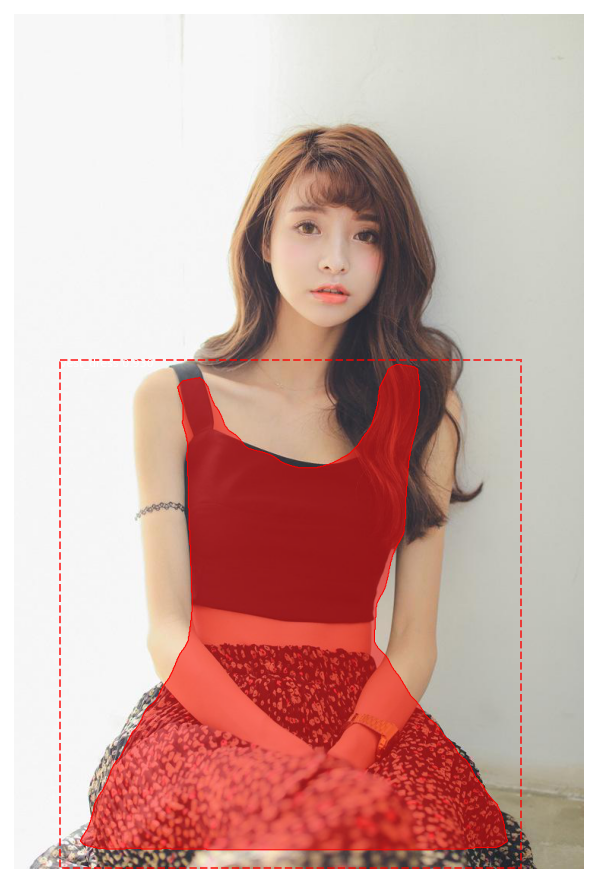

In [70]:
# Load a random image from the images folder
image_id = random.choice(df2_train_dataset.image_ids)
image_path = df2_train_dataset.image_info[image_id]['path']
print(image_path)
image = skimage.io.imread(image_path)
# Run detection
results = inference_model.detect([image], verbose=1)

# Visualize results
r = results[0]

visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            class_names, r['scores'])

In [78]:
df2_val_coco = df2_val_dataset.load_coco('../../datasets/DeepFashion2', df2_val_loader, 'validation')

creating index...
index created!


In [29]:
deepfashion2_mrcnn_dataset.evaluate_coco(model=inference_model, dataset=df2_val_dataset, eval_type='segm', coco=df2_val_loader)

0%|          | 0/32152 [00:01<?, ?it/s]


UnknownError: 2 root error(s) found.
  (0) Unknown: Failed to get convolution algorithm. This is probably because cuDNN failed to initialize, so try looking to see if a warning log message was printed above.
	 [[{{node conv1_1/convolution}}]]
	 [[mrcnn_detection/map/while/GatherV2/_8353]]
  (1) Unknown: Failed to get convolution algorithm. This is probably because cuDNN failed to initialize, so try looking to see if a warning log message was printed above.
	 [[{{node conv1_1/convolution}}]]
0 successful operations.
0 derived errors ignored.

In [ ]:
# Compute VOC-style Average Precision
def compute_batch_ap(dataset, samples_count=50):
    APs = []
    image_ids = np.random.choice(dataset.image_ids, samples_count)
    for image_id in tqdm.tqdm(image_ids):
        # Load image
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset, inference_config,
                                   image_id, use_mini_mask=False)
        # Run object detection
        results = inference_model.detect([image], verbose=0)
        # Compute AP
        r = results[0]
        AP, precisions, recalls, overlaps =\
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                              r['rois'], r['class_ids'], r['scores'], r['masks'])
        APs.append(AP)
    return APs

In [ ]:
APs = compute_batch_ap(df2_val_dataset, df2_val_dataset.num_images)
print("mAP @ IoU=50: ", np.mean(APs))